# Q1. Cumani Color Edge Detector

Search the Web for Cumani colour edge detector and write a report on it. Analyse how it may be better than doing Sobel edge detection three times on an RGB image.

For edge detection in color or multispectral images, Cumani suggests the extension of procedures based on the second
partial derivatives of the image functions. A three-channel color image C is regarded as a two-dimensional (2-D)
vector field
            C(x, y) = (C1(x, y), C2(x, y), C3(x, y))
with the three components C1(x, y), C2(x, y), and C3(x, y). In the RGB space, these vector components correspond to the
components R(x, y), G(x, y), and B(x, y) for the RGB color channels (or the long, middle, and short wave spectral transmission, respectively). The notation Ci(x, y) is given at this point, on the one hand, for a compact representation. On the other hand, it should be made clear that this technique is applicable, in general, for n-channel color images. In this connection, it is always assumed that a Euclidian metric exists for the n-dimensional vector space. Therefore, this technique cannot be easily used for edge detection in the HSI, CIELUV, or CIELAB space

Better than Sobel edge detection
Cumani edge detector finds angle between horizontal and vertical edges. Sobel separately detects edges in each of the channels, R,G and B. Since in color images, horizontal and vertical edges are not orthogonal, it finds angle between edges and magnitude of resultant edge vector.

In [54]:
import cv2 as cv
from matplotlib import pyplot as plt
import numpy as np
import glob

In [55]:
def plot_image(image,title="Image"):
    plt.imshow(image)
    plt.title(title)
    plt.show()

In [56]:
images = [cv.imread(file) for file in glob.glob("TestImages/*.ppm")]    

# Q2. Color ranging operation in RGB space

Implement colour ranging operation in RGB space on colour images. The inputs for your operation are a colour image and a colour range specification as r_c, r_bw, g_c, g_bw, b_c, b_bw where r_c stands for red colour value, r_bw is the width of the range, i.e., colours between r_c - r_bw and r_c + r_bw must be retained in the image and all other 'r' values should be set to 0. The other parameters are for green and blue colours. You should handle errors when values go out of range.

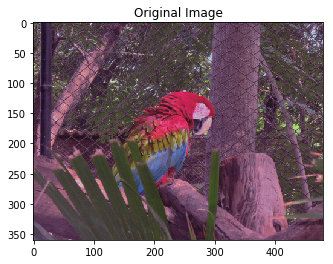

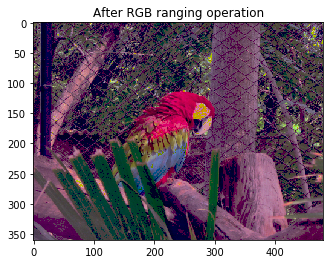

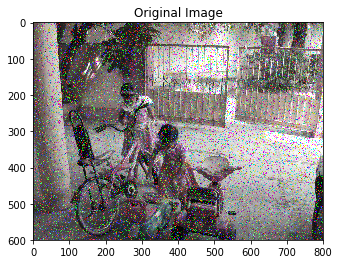

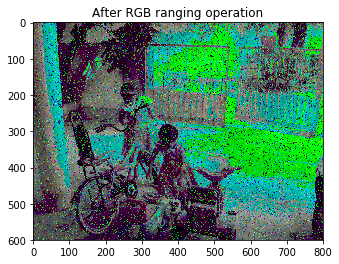

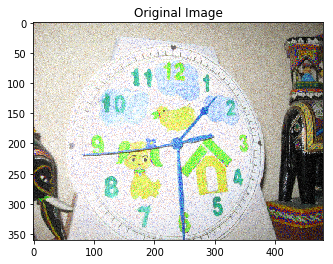

...

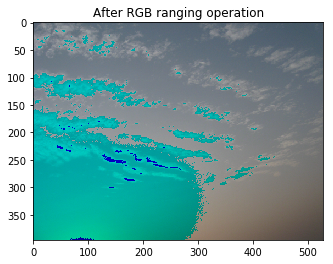

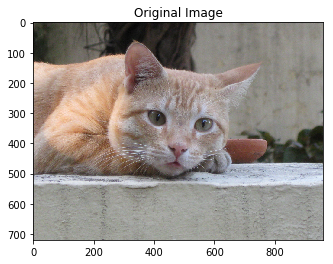

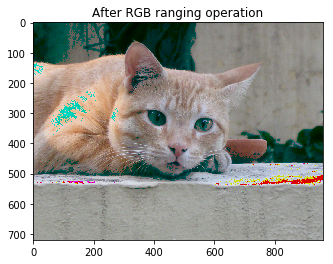

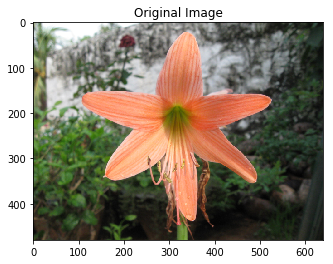

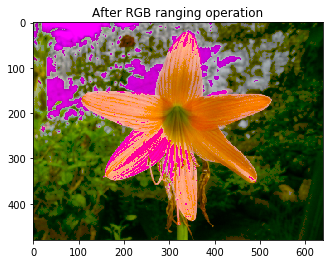

In [103]:
def check_range(value):
    if value > 255:
        return 255
    if value < 0:
        return 0
    return value

def rgb_range(image, height, width):
    r_c = np.random.randint(50,200)
    r_bw = np.random.randint(50,150)
    g_c = np.random.randint(50,200)
    g_bw = np.random.randint(50,150)
    b_c = np.random.randint(50,200)
    b_bw = np.random.randint(50,150)
    
    r_hval = check_range(r_c + r_bw) 
    r_lval = check_range(r_c - r_bw)
    g_hval = check_range(g_c + g_bw)
    g_lval = check_range(g_c - g_bw)
    b_hval = check_range(b_c + b_bw)
    b_lval= check_range(b_c - b_bw)
    
    for i in range(height):
        for j in range(width):
            image[i,j,0] = image[i,j,0] if r_lval <= image[i,j,0] <= r_hval else 0
            image[i,j,1] = image[i,j,1] if g_lval <= image[i,j,1] <= g_hval else 0
            image[i,j,2] = image[i,j,2] if b_lval <= image[i,j,2] <= b_hval else 0
    return image


for image in images:
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    height = image.shape[0]
    width = image.shape[1]
    plot_image(image, "Original Image")
    plot_image( rgb_range(image, height, width), "After RGB ranging operation" )

# Q3. Color ranging operation in HSV space

Implement colour ranging operation in HSV space on colour images. The inputs for your operation are a colour image and a colour range specification as h_c, h_bw, s_c, v_c where h_c stands for hue value, h_bw is the width of the range, i.e., colours between h_c - h_bw and h_c + h_bw must be retained in the image and all other hue values should be set to 0. The parameter s_c is a saturation threshold. Only those pixels with saturation value above the threshold should be retained. The parameter v_c is a value threshold and only pixels with value greater than v_c should be retained. You should handle errors when values go out of range.

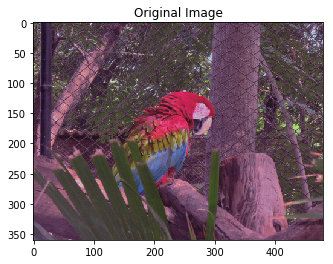

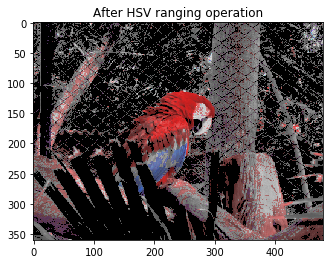

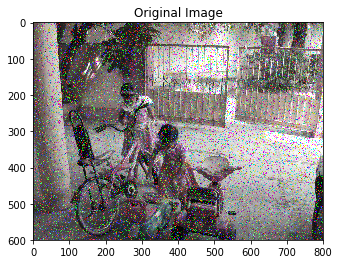

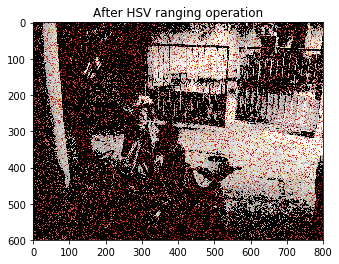

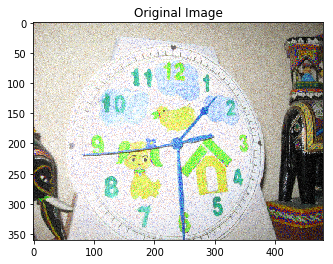

...

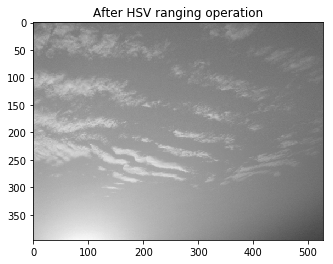

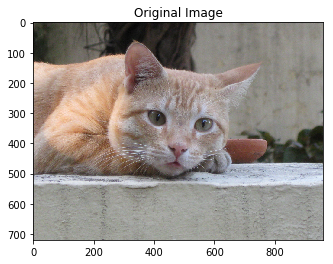

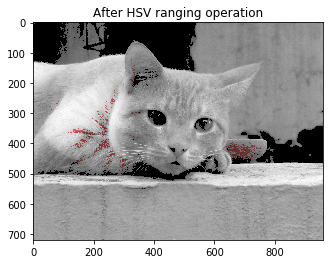

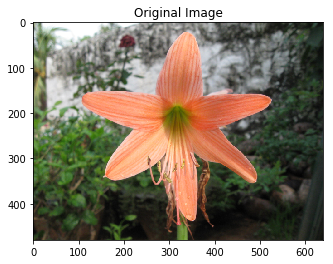

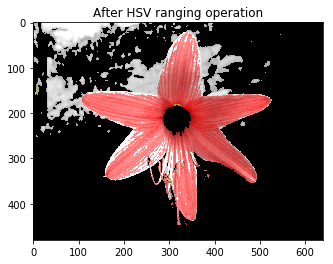

In [72]:
def get_range_h(h_c, h_w):
    return (( h_c + h_w ) % 180 ) , (( h_c - h_w ) % 180 ) 
    
def check_range_h(val, hlow, hhigh):
    if hlow < hhigh :
        if hlow <= val <= hhigh :
            return val
        else:
            return 0
    else:
        if hhigh <= val <= hlow :
            return val
        else:
            return 0
        
def check_range_sv(val, threshold):
    if val > threshold:
        return val
    return 0

def hsv_ranging(image, height, width):
    h_c = np.random.randint(50,150)
    h_bw = np.random.randint(50,100)
    s_c = np.random.randint(50,200)
    v_c = np.random.randint(50,200)
    
    hlow, hhigh = get_range_h(h_c, h_bw)
    
    for i in range(height):
        for j in range(width):
            image[i,j,0] = check_range_h( image[i,j,0], hlow, hhigh)
            image[i,j,1] = check_range_sv(image[i,j,1], s_c)
            image[i,j,2] = check_range_sv(image[i,j,2], v_c)
    return image
    
for image in images:
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    image_hsv =  cv.cvtColor(image, cv.COLOR_RGB2HSV)
    height = image_hsv.shape[0]
    width = image_hsv.shape[1]
    new_image_hsv = hsv_ranging(image_hsv, height, width)
    new_image_rgb = cv.cvtColor(new_image_hsv, cv.COLOR_HSV2RGB) 
    plot_image( image, "Original Image" )
    plot_image( new_image_rgb, "After HSV ranging operation" )

# Q4. Implement vector median filter and any one of the basic vector edge detectors. Show example images to demonstrate that these are better than the grayscale versions for colour images.

In [57]:
def euclidean_distance(x, y):
    return np.linalg.norm(x-y)

In [58]:
def get_8neighbors(image,x, y):
    x_window = [-1,0,1]
    y_window = [-1,0,1]
    n = []
    for i in x_window:
        for j in y_window:
            n.append(image[x+i,y+j,:])
    return n

## Vector Median Filter

In [84]:
def vector_median(image, height, width):
    '''
    take 3x3 window
    for each pixel as origin of window, take mean of 9 pixels(pixel and its 8 neighbours)
    find Euclidean distance of each pixel in window from mean
    replace pixel vector with vec closest to mean(shortest distance)
    
    '''  
    new_image = image.copy()
    index = {'0':[-1,-1], '1':[-1,0], '2':[-1,+1], '3':[0,-1], '4':[0,0], '5':[0,+1], '6':[+1,-1], '7':[+1,0], '8':[+1,+1]}
    for i in range(height-2):
        for j in range(width-2):
            distances = []
            neighbors = get_8neighbors(image,i,j)
            mean_vec = np.mean(neighbors, axis=0)
            for pixel in neighbors:
                distances.append(euclidean_distance(mean_vec, pixel))
            new_pixel_index = distances.index(min(distances))
            new_pixel = index[str(new_pixel_index)]
            new_image[i,j,:] = image[i+new_pixel[0], j+new_pixel[1], :]
    plot_image(new_image,"Vector Median Filtered Image")  

In [83]:
def vector_median_grayscale_version(image, height, width):
    '''
    for each channel, 
        find median of 9 values, replace pixel with median
    '''
    new_image = image.copy()
#     index = {'0':[-1,-1], '1':[-1,0], '2':[-1,+1], '3':[0,-1], '4':[0,0], '5':[0,+1], '6':[+1,-1], '7':[+1,0], '8':[+1,+1]}
    for i in range(height-3):
        for j in range(width-3):
            neighbors = get_8neighbors(image,i,j)
            median_vec = np.median(neighbors, axis=0)
#             print(median_vec)
            new_image[i,j,0] = median_vec[0]
            new_image[i,j,1] = median_vec[1]
            new_image[i,j,2] = median_vec[2]
#     
    return new_image


(360, 480, 3)


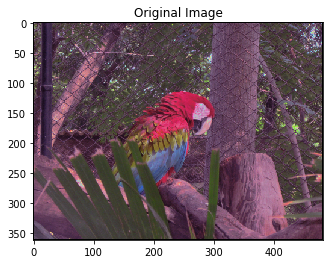

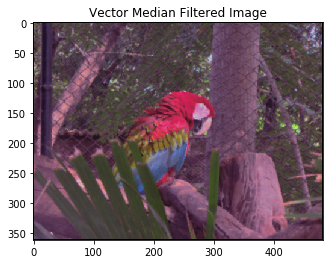

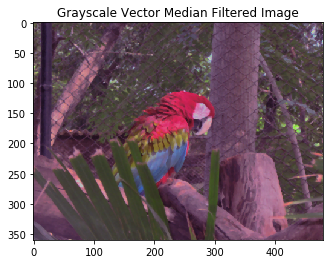

(600, 800, 3)


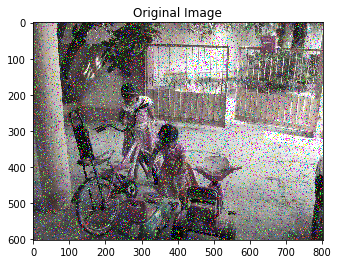

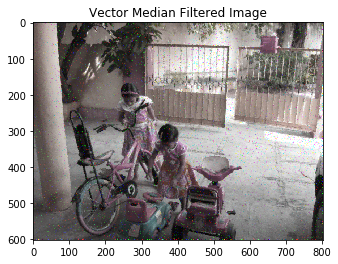

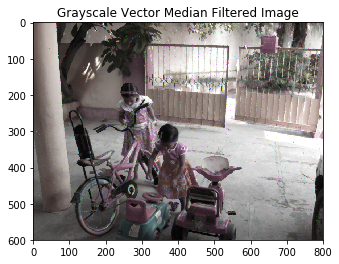

(360, 480, 3)


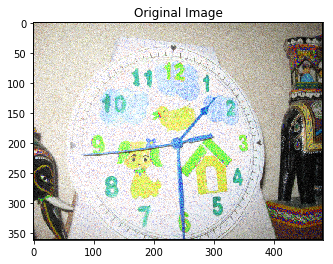

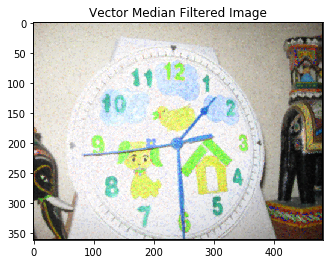

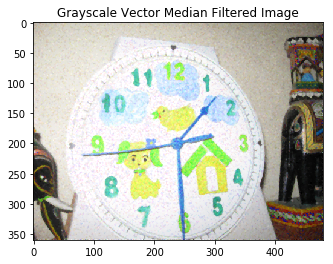

(396, 528, 3)


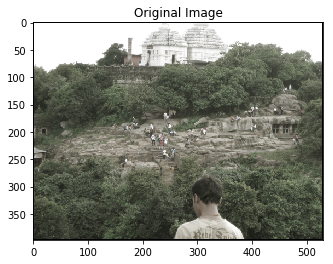

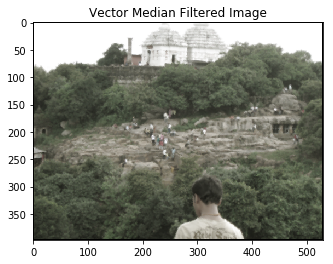

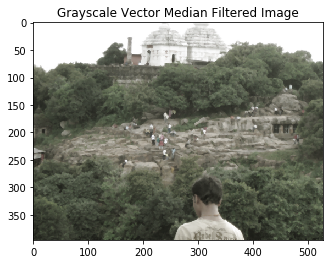

(450, 600, 3)


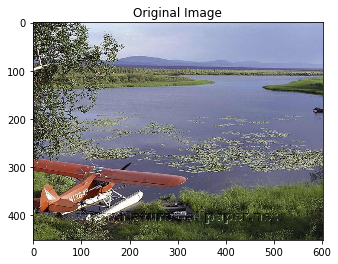

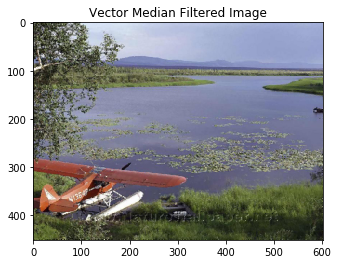

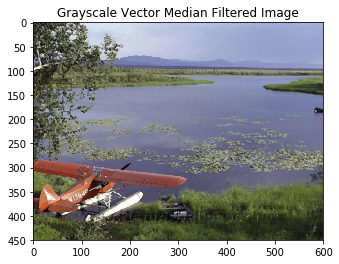

(386, 448, 3)


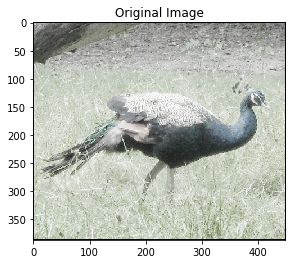

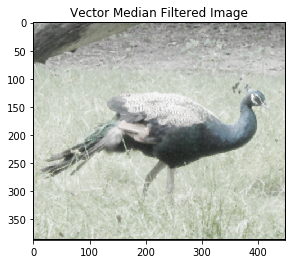

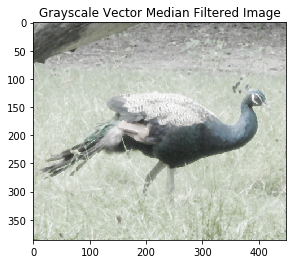

(480, 640, 3)


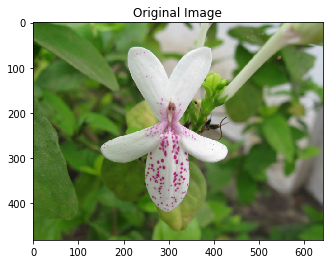

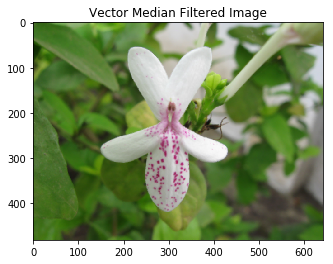

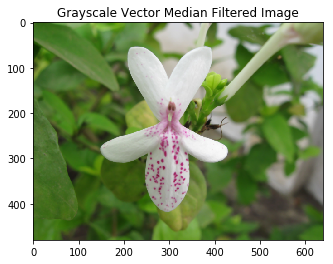

(396, 528, 3)


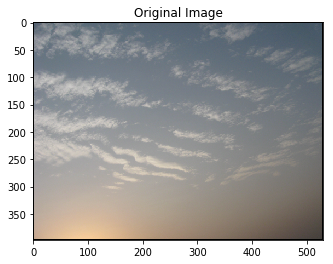

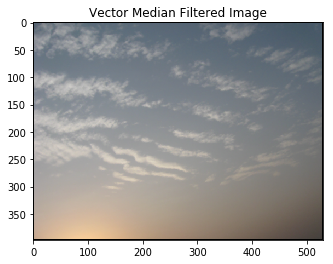

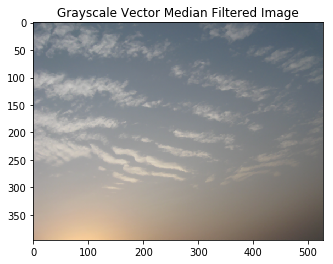

(720, 960, 3)


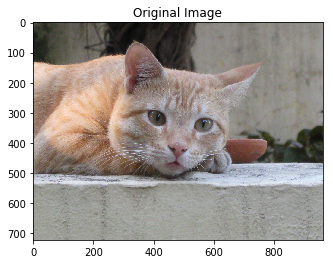

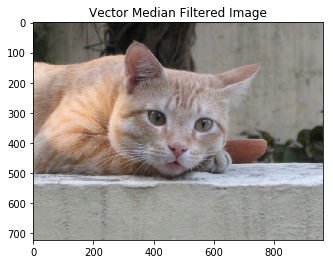

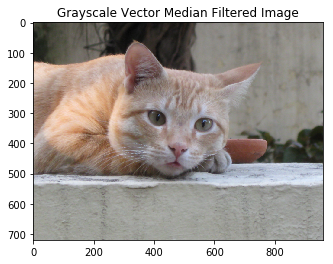

(480, 640, 3)


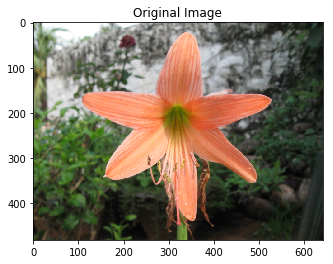

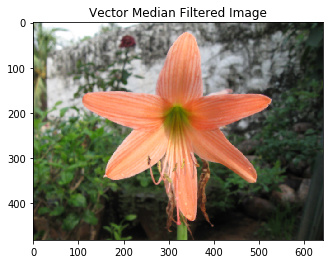

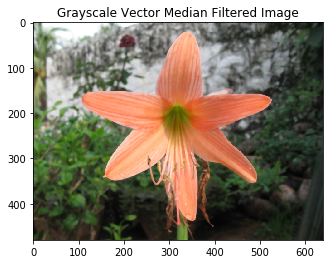

In [71]:
for image in images:
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    padded_image = cv.copyMakeBorder(image, 1, 1, 1, 1, cv.BORDER_CONSTANT)

    height = padded_image.shape[0]
    width = padded_image.shape[1]
    
    print(image.shape)
    plot_image(padded_image, "Original Image")
    vector_median(padded_image, height, width)
    plot_image( vector_median_grayscale_version(image, height, width), "Grayscale Vector Median Filtered Image" )

# Sobel Vector Edge Detector

In [95]:
horizontal_filter = np.array([
            [-1,-2,-1],
            [0,0,0],
            [+1,+2,+1]
        ])
vertical_filter = np.array([
            [-1,0,1],
            [-2,0,2],
            [-1,0,1]
        ])

In [100]:
def grayscale_sobel_filter(image, height, width):
    image = vector_median_grayscale_version(image, height, width)
    new_image = image.copy()
    for i in range(height-3):
            for j in range(width-3):
                neighbors = get_8neighbors(image,i,j)
                
                red_values = np.array([ pixel_value[0] for pixel_value in neighbors])
                red_values = red_values.reshape((3,3))
                
                green_values = np.array([ pixel_value[1] for pixel_value in neighbors])
                green_values = green_values.reshape((3,3))

                blue_values = np.array([ pixel_value[2] for pixel_value in neighbors])
                blue_values = blue_values.reshape((3,3))

                sum1_h = np.multiply(red_values, horizontal_filter).sum()
                sum1_v = np.multiply(red_values, vertical_filter).sum()
                value = np.sqrt( np.square(sum1_h) + np.square(sum1_v) )
                new_image[i,j,0] = value if 0 <= value <= 255 else 255 if value>255 else 0
                
                sum2_h = np.multiply(green_values, horizontal_filter).sum()
                sum2_v = np.multiply(green_values, vertical_filter).sum()
                value = np.sqrt( np.square(sum2_h) + np.square(sum2_v) )
                new_image[i,j,1] = value if 0 <= value <= 255 else 255 if value>255 else 0
                
                sum3_h = np.multiply(blue_values, horizontal_filter).sum()
                sum3_v = np.multiply(blue_values, vertical_filter).sum()
                value = np.sqrt( np.square(sum3_h) + np.square(sum3_v) )
                new_image[i,j,2] = value if 0 <= value <= 255 else 255 if value>255 else 0
                
    plot_image(new_image, "Sobel Vector edges-grayscale version")

In [101]:
'''
vectorised version of Sobel edge detector

replace each pixel vector with convoluted vector
'''

def vector_sobel_filter(image, height, width):
    image = vector_median_grayscale_version(image, height, width)
    new_image = image.copy()
    for i in range(height-3):
            for j in range(width-3):
                neighbors = get_8neighbors(image,i,j)
                new_pixel_x = (1/4) * ( - (image[i-1,j-1,:] + 2*image[i,j-1,:] + image[i+1,j-1,:])\
                                        + (image[i-1,j+1,:] + 2*image[i,j+1,:] + image[i+1,j+1,:]) 
                                      )
                new_pixel_y = (1/4) * ( - (image[i-1,j-1,:] + 2*image[i-1,j,:] + image[i-1,j+1,:])\
                                        + (image[i+1,j-1,:] + 2*image[i+1,j,:] + image[i+1,j+1,:])
                                      )
                new_pixel = np.sqrt( np.square(new_pixel_x) + np.square(new_pixel_y) )
                new_image[i,j,0] = new_pixel[0] if 0 <= new_pixel[0] <= 255 else 255 if new_pixel[0] >255 else 0
                new_image[i,j,1] = new_pixel[1] if 0 <= new_pixel[1] <= 255 else 255 if new_pixel[1] >255 else 0
                new_image[i,j,2] = new_pixel[2] if 0 <= new_pixel[2] <= 255 else 255 if new_pixel[2] >255 else 0
                
    plot_image(new_image, "Sobel Vector edges-vector version")

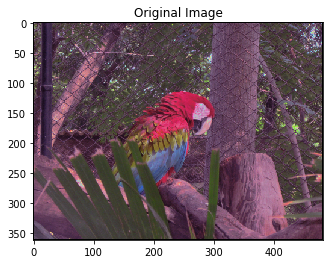

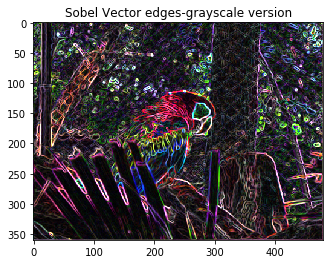

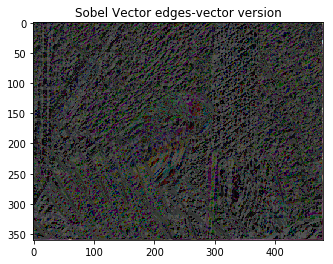

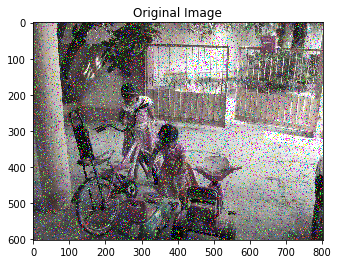

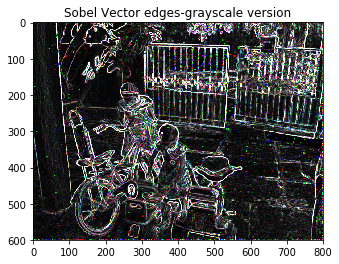

...

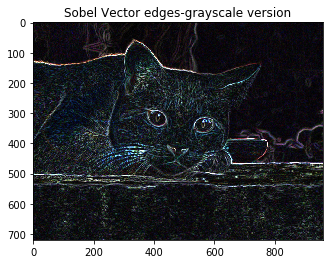

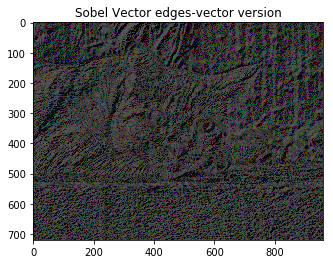

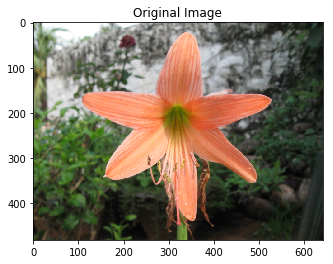

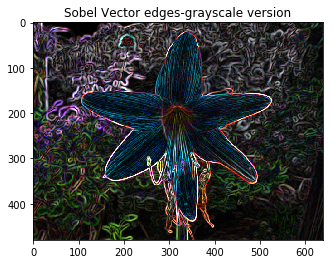

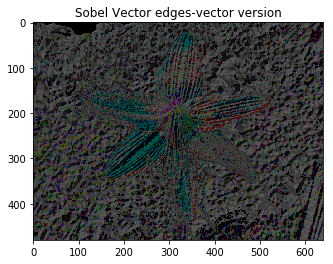

In [102]:
for image in images:
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    padded_image = cv.copyMakeBorder(image, 1, 1, 1, 1, cv.BORDER_CONSTANT)

    height = padded_image.shape[0]
    width = padded_image.shape[1]

    plot_image(padded_image, "Original Image")
    
    grayscale_sobel_filter(image, height, width)
    vector_sobel_filter(image, height, width)